In [1]:
!pip install d2l==1.0.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 884.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 48.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.7/124.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.9 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.32.3
    Uninstalling requests-2.32.3:
      Successf

In [21]:
import collections
import random
import re
import torch
from d2l import torch as d2l
!pip install torch

import torch
from torch import nn

In [27]:

import torch.nn.functional as F

In [ ]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(device)

In [11]:
# class TimeMachine(d2l.DataModule):
#     """The Time Machine dataset."""
#     def __init__(self, batch_size, num_steps, num_train=10000, num_val=5000):
#         super(d2l.TimeMachine, self).__init__()
#         self.save_hyperparameters()
#         corpus, self.vocab = self.build(self._download())
#         array = torch.tensor([corpus[i:i+num_steps+1]
#                             for i in range(len(corpus)-num_steps)])
#         self.X, self.Y = array[:,:-1], array[:,1:]

class TimeMachine(d2l.DataModule):
    """The Time Machine dataset."""
    def __init__(self, batch_size, num_steps, num_train=10000, num_val=5000):
        # Change this line:
        super().__init__() # or super(TimeMachine, self).__init__()
        # From this:
        # super(d2l.TimeMachine, self).__init__()
        self.save_hyperparameters()
        corpus, self.vocab = self.build(self._download())
        array = torch.tensor([corpus[i:i+num_steps+1]
                            for i in range(len(corpus)-num_steps)])
        self.X, self.Y = array[:,:-1], array[:,1:]


    def _download(self):
        fname = d2l.download(d2l.DATA_URL + 'timemachine.txt', self.root,
                             '090b5e7e70c295757f55df93cb0a180b9691891a')
        with open(fname) as f:
            return f.read()

    def _preprocess(self, text):
        return re.sub('[^A-Za-z]+', ' ', text).lower()

    def _tokenize(self, text):
        return list(text)

    def build(self, raw_text, vocab=None):
        tokens = self._tokenize(self._preprocess(raw_text))
        if vocab is None: vocab = Vocab(tokens)
        corpus = [vocab[token] for token in tokens]
        return corpus, vocab

    def get_dataloader(self, train):
        idx = slice(0, self.num_train) if train else slice(
            self.num_train, self.num_train + self.num_val)
        return self.get_tensorloader([self.X, self.Y], train, idx)

In [12]:
data = TimeMachine(batch_size=32, num_steps=35)
raw_text = data._download()
raw_text[:60]

'The Time Machine, by H. G. Wells [1898]\n\n\n\n\nI\n\n\nThe Time Tra'

In [13]:
text = data._preprocess(raw_text)
text[:60]

'the time machine by h g wells i the time traveller for so it'

In [14]:
tokens = data._tokenize(text)
','.join(tokens[:30])

't,h,e, ,t,i,m,e, ,m,a,c,h,i,n,e, ,b,y, ,h, ,g, ,w,e,l,l,s, '

In [15]:
class Vocab:
    """Vocabulary for text."""
    def __init__(self, tokens=[], min_freq=0, reserved_tokens=[]):
        # Flatten a 2D list if needed
        if tokens and isinstance(tokens[0], list):
            tokens = [token for line in tokens for token in line]
        # Count token frequencies
        counter = collections.Counter(tokens)
        self.token_freqs = sorted(counter.items(), key=lambda x: x[1],
                                  reverse=True)
        # The list of unique tokens
        self.idx_to_token = list(sorted(set(['<unk>'] + reserved_tokens + [
            token for token, freq in self.token_freqs if freq >= min_freq])))
        self.token_to_idx = {token: idx
                             for idx, token in enumerate(self.idx_to_token)}

    def __len__(self):
        return len(self.idx_to_token)

    def __getitem__(self, tokens):
        if not isinstance(tokens, (list, tuple)):
            return self.token_to_idx.get(tokens, self.unk)
        return [self.__getitem__(token) for token in tokens]

    def to_tokens(self, indices):
        if hasattr(indices, '__len__') and len(indices) > 1:
            return [self.idx_to_token[int(index)] for index in indices]
        return self.idx_to_token[indices]

    @property
    def unk(self):  # Index for the unknown token
        return self.token_to_idx['<unk>']

In [16]:
vocab = Vocab(tokens)
indices = vocab[tokens[:10]]
print('indices:', indices)
print('words:', vocab.to_tokens(indices))

indices: [21, 9, 6, 0, 21, 10, 14, 6, 0, 14]
words: ['t', 'h', 'e', ' ', 't', 'i', 'm', 'e', ' ', 'm']


In [17]:
corpus, vocab = data.build(raw_text)
len(corpus), len(vocab)

(173428, 28)

In [18]:
data = d2l.TimeMachine(batch_size=2, num_steps=10)
for X, Y in data.train_dataloader():
    print('X:', X, '\nY:', Y)
    break

X: tensor([[25, 17,  6, 19, 10, 14,  6, 15, 21,  0],
        [ 9, 10, 20,  0,  8,  6, 16, 14,  6, 21]]) 
Y: tensor([[17,  6, 19, 10, 14,  6, 15, 21,  0,  4],
        [10, 20,  0,  8,  6, 16, 14,  6, 21, 19]])


In [19]:
class RNNScratch(d2l.Module):
    """The RNN model implemented from scratch."""
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.W_xh = nn.Parameter(
            torch.randn(num_inputs, num_hiddens) * sigma)
        self.W_hh = nn.Parameter(
            torch.randn(num_hiddens, num_hiddens) * sigma)
        self.b_h = nn.Parameter(torch.zeros(num_hiddens))

    def forward(self, inputs, state=None):
        if state is None:
            # Initial state with shape: (batch_size, num_hiddens)
            state = torch.zeros((inputs.shape[1], self.num_hiddens),
                              device=inputs.device)
        else:
            state, = state
        outputs = []
        for X in inputs:  # Shape of inputs: (num_steps, batch_size, num_inputs)
            state = torch.tanh(torch.matmul(X, self.W_xh) +
                            torch.matmul(state, self.W_hh) + self.b_h)
            outputs.append(state)
        return outputs, state

In [22]:
batch_size, num_inputs, num_hiddens, num_steps = 2, 16, 32, 100
rnn = RNNScratch(num_inputs, num_hiddens)
X = torch.ones((num_steps, batch_size, num_inputs))
outputs, state = rnn(X)

In [23]:
def check_len(a, n):
    """Check the length of a list."""
    assert len(a) == n, f'list\'s length {len(a)} != expected length {n}'

def check_shape(a, shape):
    """Check the shape of a tensor."""
    assert a.shape == shape, \
            f'tensor\'s shape {a.shape} != expected shape {shape}'

check_len(outputs, num_steps)
check_shape(outputs[0], (batch_size, num_hiddens))
check_shape(state, (batch_size, num_hiddens))

In [24]:
class RNNLMScratch(d2l.Classifier):
    """The RNN-based language model implemented from scratch."""
    def __init__(self, rnn, vocab_size, lr=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.init_params()

    def init_params(self):
        self.W_hq = nn.Parameter(
            torch.randn(
                self.rnn.num_hiddens, self.vocab_size) * self.rnn.sigma)
        self.b_q = nn.Parameter(torch.zeros(self.vocab_size))

    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=True)
        return l

    def validation_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=False)

    def one_hot(self, X):
        # Output shape: (num_steps, batch_size, vocab_size)
        return F.one_hot(X.T, self.vocab_size).type(torch.float32)

    def output_layer(self, rnn_outputs):
        outputs = [torch.matmul(H, self.W_hq) + self.b_q for H in rnn_outputs]
        return torch.stack(outputs, 1)

    def forward(self, X, state=None):
        embs = self.one_hot(X)
        rnn_outputs, _ = self.rnn(embs, state)
        return self.output_layer(rnn_outputs)

    def predict(self, prefix, num_preds, vocab, device=None):
        state, outputs = None, [vocab[prefix[0]]]
        for i in range(len(prefix) + num_preds - 1):
            X = torch.tensor([[outputs[-1]]], device=device)
            embs = self.one_hot(X)
            rnn_outputs, state = self.rnn(embs, state)
            if i < len(prefix) - 1:  # Warm-up period
                outputs.append(vocab[prefix[i + 1]])
            else:  # Predict num_preds steps
                Y = self.output_layer(rnn_outputs)
                outputs.append(int(Y.argmax(axis=2).reshape(1)))
        return ''.join([vocab.idx_to_token[i] for i in outputs])

In [28]:
model = RNNLMScratch(rnn, num_inputs)
outputs = model(torch.ones((batch_size, num_steps), dtype=torch.int64))
check_shape(outputs, (batch_size, num_steps, num_inputs))

In [26]:
@d2l.add_to_class(d2l.Trainer)
def clip_gradients(self, grad_clip_val, model):
    params = [p for p in model.parameters() if p.requires_grad]
    norm = torch.sqrt(sum(torch.sum((p.grad ** 2)) for p in params))
    if norm > grad_clip_val:
        for param in params:
            param.grad[:] *= grad_clip_val / norm

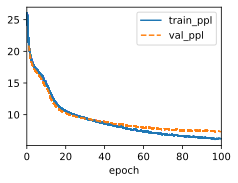

In [29]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

# **ANSWER 1**

In [31]:
batch_size = 1024
num_hiddens = 64
num_steps = 50
learning_rate = 0.5
max_epochs = 200

data = TimeMachine(batch_size=batch_size, num_steps=num_steps)

rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=num_hiddens)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=learning_rate)

trainer = d2l.Trainer(max_epochs=max_epochs, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

In [ ]:
batch_size = 1024
num_hiddens = 128
num_steps = 50
learning_rate = 0.8
max_epochs = 175

data = TimeMachine(batch_size=batch_size, num_steps=num_steps)

rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=num_hiddens)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=learning_rate)

trainer = d2l.Trainer(max_epochs=max_epochs, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

In [ ]:
batch_size = 1024
num_hiddens = 256
num_steps = 55
learning_rate = 0.9
max_epochs = 150

data = TimeMachine(batch_size=batch_size, num_steps=num_steps)

rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=num_hiddens)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=learning_rate)

trainer = d2l.Trainer(max_epochs=max_epochs, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

In [ ]:
batch_size = 1024
num_hiddens = 256
num_steps = 60
learning_rate = 1
max_epochs = 200

data = TimeMachine(batch_size=batch_size, num_steps=num_steps)

rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=num_hiddens)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=learning_rate)

trainer = d2l.Trainer(max_epochs=max_epochs, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

# **ANSWER 2**

In [33]:
import torch.nn as nn

class RNNLMScratch(d2l.Classifier):
    """The RNN-based language model with embeddings."""
    def __init__(self, rnn, vocab_size, embed_size=32, lr=0.5):
        super().__init__()
        self.save_hyperparameters()
        self.init_params()
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.rnn = rnn

    def init_params(self):
        self.W_hq = nn.Parameter(
            torch.randn(
                self.rnn.num_hiddens, self.vocab_size) * self.rnn.sigma)
        self.b_q = nn.Parameter(torch.zeros(self.vocab_size))

    def forward(self, X, state=None):
        embs = self.embedding(X)  # Use embeddings instead of one-hot
        rnn_outputs, _ = self.rnn(embs.permute(1, 0, 2), state)
        return self.output_layer(rnn_outputs)

    def output_layer(self, rnn_outputs):
        outputs = [torch.matmul(H, self.W_hq) + self.b_q for H in rnn_outputs]
        return torch.stack(outputs, 1)

embed_size = 32

rnn = RNNScratch(num_inputs=embed_size, num_hiddens=num_hiddens)  # Adjust for embedding size
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), embed_size=embed_size, lr=learning_rate)

trainer.fit(model, data)


#Exercises
##1) Adjust the hyperparameters (e.g., number of epochs, number of hidden units, number of time steps in a minibatch, and learning rate) to improve the perplexity. How low can you go while sticking with this simple architecture? [5 Marks]

##2) Replace one-hot encoding with learnable embeddings. Does this lead to better performance? [5 Marks]